# **Group M (Mohamed Boutaleb, Francesco Moro)**

# Machine Learning Project - Diamond Analysis

## Introduction
In this notebook will be performed the analysis of the [diamond dataset](https://www.kaggle.com/shivam2503/diamonds), a collection of almost **54,000** diamonds.<br>
To realize interesting analysis and predictions about the considered dataset, we decided to maintain as target variable the column named "price". In this way it is possible to predict it through different methods, allowing us to compare the results obtained.

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
### Keeping safe from any disaster :) ###
%autosave 30

Autosaving every 30 seconds


# **4C's Diamond**

<img src="./img/4cs.png" alt="drawing" width="400"/>

[Image source: Diamond Education Learning](https://www.youtube.com/watch?v=qJs6P7ChGd8)


### In a nutshell, to understand how much a diamond is worth, we should start with the basics, i.e. the 4 C's (CARAT, CLARITY, COLOR, CUT). These explain very well the quality of a diamond: 
* <span style="color:red"><b>Carat</span>: Carat is the weight of the diamond. Bigger the diamond, rare to find them.
* <span style="color:red"><b>Clarity</span>: Clarity of the diamond is intrusions in the diamond, which could be internal flaws, external defects.
* <span style="color:red"><b>Color</span>: Color of the diamond is self explinary, and on scale of AtoZ, A is best and colorless, where as Z is worst and yellowish color. The colorless diamonds are rare and costly.
* <span style="color:red"><b>Cut</span>: Cut of the diamond is about physical dimensions of the diamond. It determine the light amount enter into the diamond. Anotomy of the diamond is an important parameter.



# **Cut and Components**

<div style="display: flex;"><img src="./img/Diamond-Cut.jpg" alt="drawing" width="600"/> <img src="./img/Diamond-Components.jpg" alt="drawing" width="600"/></div>

### There are several things to consider to see in a diamond. Few such is **table%**, **depth%** and **cuts**. Diamond anotomy is given it the cut of the diamond infographic in the above image.
All the basic information about the diamond cut are given above.
Side view of the diamond show the terminology and meaning of his features.
Thus table length, table width, diamond depth, depth%, and table% are very important features to determine the price of a diamond.

## **Libraries used**
For these analyses we used some libraries covered during the course and partly others based on their documentation. Below is the list:
* **numpy**
* **pandas**
* **plotly**
* **scikit learn**
* **ml_utilities**
* **ml_visualization**

* **seaborn**
* **matplotlib**

In [3]:
### Imports ###
import numpy as np
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly
import plotly.offline as py
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

from sklearn.dummy import DummyClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression 
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from IPython.display import Markdown, display


from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# importing the modules
from IPython.display import display

from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as st

import ml_utilities
import ml_visualization

## **Reading the dataset**
In order to properly import the dataset you need to:
* Download the zipper from [here](https://www.kaggle.com/shivam2503/diamonds)
* Extract it
* Move it into the current directory `./`.

In [4]:
### Reading .csv dataset ###
dfName = "diamonds.csv"
df = pd.read_csv(dfName)

## **Preliminary analysis**
### What are the columns?

In [5]:
### Describing the df characteristics ###
df.describe()

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [6]:
### How many non-null fields are there? ###
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [7]:
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


## **Dropping and remapping columns**

In [8]:
### Dropping unnecessary column. Additional index ###
df.drop('Unnamed: 0', axis=1, inplace=True)

df_mapped=df.copy()

### Remapping all necessary columns
df_mapped['color'] = df['color'].replace(['J','I','H','G','F','E','D'],[1,2,3,4,5,6,7])
df_mapped['cut'] = df['cut'].replace(['Fair','Good','Very Good','Premium','Ideal'],[1,2,3,4,5])
df_mapped['clarity'] = df['clarity'].replace(['I3','I2','I1','SI2','SI1','VS2','VS1','VVS2','VVS1','IF'],[1,2,3,4,5,6,7,8,9,10])

In [9]:
#Functino to print in Markdown
def printmd(string):
    display(Markdown(string))

## **First question we asked ourselves**
### Is there a correlation between price and carats?
Clearly we notice immediately that the pair of carat-price features are directly proportional:
as the carats increase we have confirmation that the price increases easily.

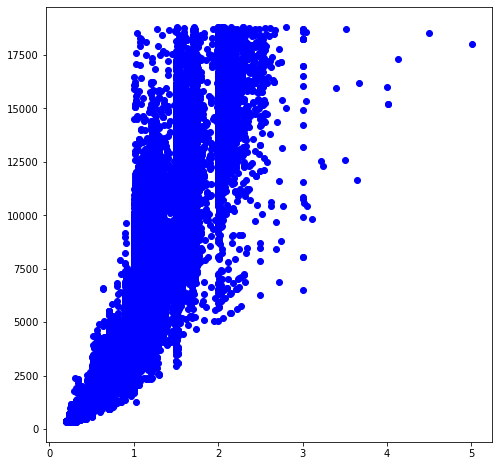

In [10]:
# # Scatter plot of the carat and price
# fig=make_subplots(rows=1, cols=1)
# fig.add_trace(go.Scatter(x=df_mapped["carat"], y=df_mapped["price"], mode="markers", name="Diamonds price basing on carats"))

# fig.update_layout(
#     title="Diamonds price basing on carats",
#     xaxis_title="Carat",
#     yaxis_title="Price",
#     legend_title="Legend Title",
# )

plt.plot(df_mapped["carat"], df_mapped["price"], 'o', color='blue');

## **How do the other attributes of the diamond infer price?**
In this plot we can see an alternative and colorful representation of how each feature infer the price. <br>
It is useful observe the legend on the right side that will explain how interpret each element in the plot.

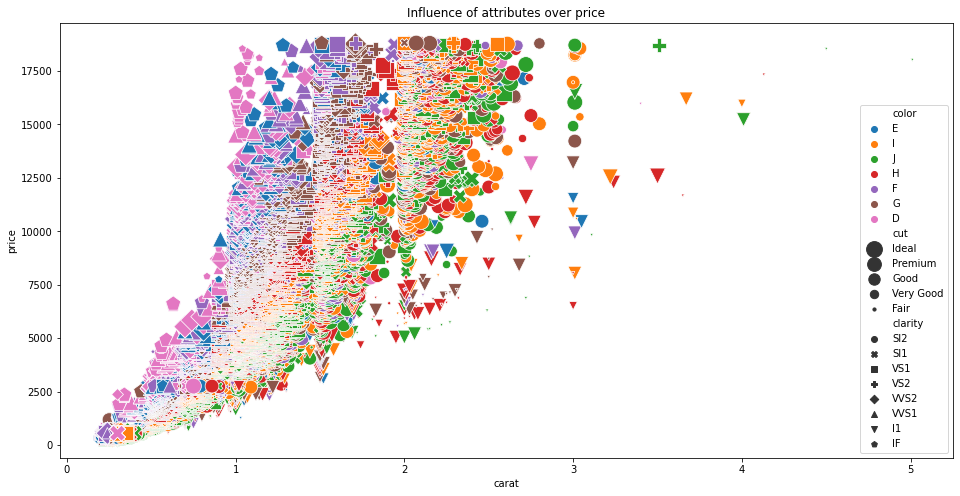

In [11]:
# showing how the feature could infer price
plt.figure(figsize=(16,8))
sns.scatterplot(data=df, x="carat", y="price", hue="color",size="cut", style="clarity", sizes=(10,250))
plt.title("Influence of attributes over price")
plt.show()

## **How do price quantiles change according to categorical attributes?**
In the following set of charts, there will be considered how the categorical attributes infer price variable.
It is possible to get an alternative view of how the price varies for each categorical variable.
What we expected was that the quantiles of price would increase as the quality of the categorical variables increased.
And indeed despite the numerous outliers this pattern is easily identifiable from the boxplots.

In [12]:
categoricalAttributes=["clarity", "cut", "color"]
targetVariable="price"

for attribute in categoricalAttributes:
    fig = px.box(data_frame=df_mapped,orientation="h",y=attribute,x="price",title=f"{targetVariable} related to {attribute}")
    fig.show()

## **What is the distribution of the diamonds in this Dataset according to attributes?**
This set of plot represents the relation between each feature with the considered target.
Clearly, the pairs clarity-price, color-price and cut-price will consider a discrete dimensional space due to its categorical nature.
The other ones will represent the distribution of price in a continuous context.

Text(0.5, 0.98, 'Features distributions')

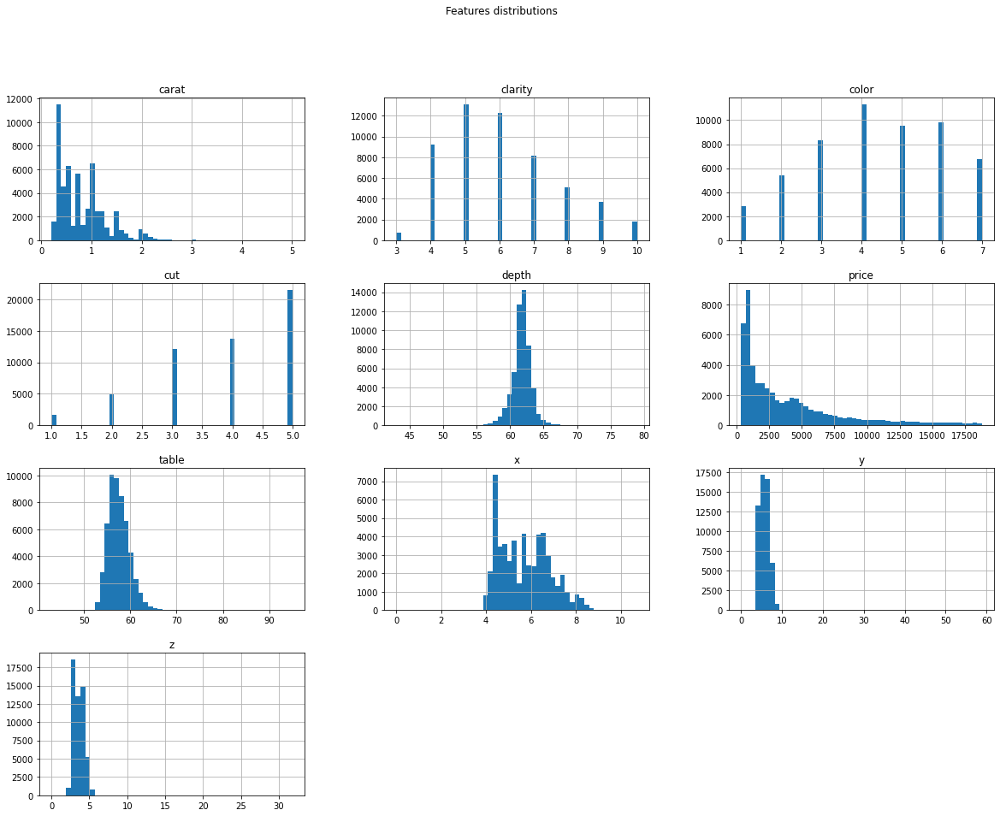

In [13]:
df_mapped.hist(bins=50, figsize=(20,15))
plt.suptitle("Features distributions")

# **Linear Regression**
As said before we will make analyses where the target price variable will be the focus point. Since this says a lot about the diamond. Let's do a pre-analysis to see from the correlation value which features are most closely correlated with price. 

## Computing correlation matrix to detect some linear patterns


In [14]:
### calculation of the correlation coefficient between price and all other fields ###
corr_matrix = df_mapped.corr()

print(corr_matrix["price"].sort_values(ascending = False))

price      1.000000
carat      0.921591
x          0.884435
y          0.865421
z          0.861249
table      0.127134
depth     -0.010647
cut       -0.053491
clarity   -0.146800
color     -0.172511
Name: price, dtype: float64


### As can be seen from the graphs and the data (R2), we can notice that the correlation between carats and price is linear, the same with the x, y and z features. What tend to have a normal distribution are the features depth and table. <br>
To make the computation time of the code more optimal we made a sample of the dataset to make the plots of each linear regression

In [15]:
rows=1
cols=0
#split dataset in features and target variable
feature_cols = ['carat', 'table', 'x', 'y', 'z', 'depth']
# feature_cols = ['depth']
valid_portion=0.30
fig = make_subplots(rows=2, cols=3, subplot_titles=("Linear Regression for Carat feature", "Linear Regression for Table feature","Linear Regression for X feature", 
                                                   "Linear Regression for Y feature", "Linear Regression for Z feature", "Linear Regression for Depth feature"))
fig['layout']['xaxis1']['title']=feature_cols[0]
fig['layout']['xaxis2']['title']=feature_cols[1]
fig['layout']['xaxis3']['title']=feature_cols[2]
fig['layout']['xaxis4']['title']=feature_cols[3]
fig['layout']['xaxis5']['title']=feature_cols[4]
fig['layout']['xaxis6']['title']=feature_cols[5]

for i in range(1, 7):
    fig['layout']['yaxis{}'.format(i)]['title']="price"


for i in feature_cols:
    X = df_mapped[i] # Features
    y = df_mapped.price.astype('float64') # Target variable

    train_x, validation_x, train_y, validation_y = train_test_split(X, y, test_size=valid_portion, random_state=1)
    
    train_x=train_x.values.reshape(-1, 1)
    validation_x=validation_x.values.reshape(-1, 1)
    
    train_y=train_y.values.reshape(-1, 1)
    validation_y=validation_y.values.reshape(-1, 1)
    
    # Addestramento di un LinearRegression
    lin_reg = LinearRegression()
    lin_reg.fit(train_x, train_y)

    # Ottenimento delle predizioni
    train_y_predicted = lin_reg.predict(train_x)

    # Calcolo del RMSE
    rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
    printmd(f"**Data Information on {i}**")
    print('Train RMSE: ', rmse) 

    # Ottenimento delle predizioni (validation) e calcolo RMSE
    validation_y_predicted = lin_reg.predict(validation_x)
    rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
    print('Validation RMSE: ', rmse)
    print('R2 score:', lin_reg.score(validation_x, validation_y))
    
    w=lin_reg.coef_[0][0]
    b=lin_reg.intercept_
    
    y_hat = b +w*X
    
    x_line = np.array([np.min(X), np.max(X)]) # Prova a modificare gli estremi, per estrapolare la linea
    y_line = b + w*x_line
    
    if cols==3:
        cols=0
        rows=2
    
    cols=cols+1

    fig.add_trace(go.Scatter(x=pd.Series(X).sample(n=500, random_state=132), y=pd.Series(y).sample(n=500, random_state=132), mode="markers", name="data"), row=rows, col=cols)
    fig.add_trace(go.Scatter(x=pd.Series(X).sample(n=500, random_state=132), y=pd.Series(y_hat).sample(n=500, random_state=132), mode="markers", name="estimate"),row=rows, col=cols)
    fig.add_trace(go.Scatter(x=pd.Series(X).sample(n=500, random_state=132), y=pd.Series(y_hat).sample(n=500, random_state=132), mode="lines", name="regression line"),row=rows, col=cols)

#     # Disegnamo le linee verticali corrispondenti agli errori (residui)
#     for i in range(len(X)):
#         data.append(go.Scatter(x=[X[i], X[i]], y=[y[i], y_hat[i]], mode="lines",
#             showlegend=False, line=dict(color="gray", width=0.5)),)

fig.show()

**Data Information on carat**

Train RMSE:  1560.5276938406769
Validation RMSE:  1520.3317090552023
R2 score: 0.8493196667739158


**Data Information on table**

Train RMSE:  3987.536167459719
Validation RMSE:  3885.017951050689
R2 score: 0.016066098278325724


**Data Information on x**

Train RMSE:  1877.118093178531
Validation RMSE:  1825.6024177121258
R2 score: 0.7827337495915477


**Data Information on y**

Train RMSE:  2070.0363229147342
Validation RMSE:  1825.6734589316966
R2 score: 0.7827168399297663


**Data Information on z**

Train RMSE:  2073.91823176725
Validation RMSE:  1915.4660086333242
R2 score: 0.7608178508319458


**Data Information on depth**

Train RMSE:  4019.899198428712
Validation RMSE:  3916.634223668388
R2 score: -1.3571168991033389e-05


### To make the idea even clearer, it may be useful to look at this heatmap of all the correlations between the various columns. We can see how the features carat, x, y and z are closely correlated with price. Although when we later go to do the Lasso we will see that in reality x is never sent to 0.

Text(0.5, 1.0, 'Correlation matrics')

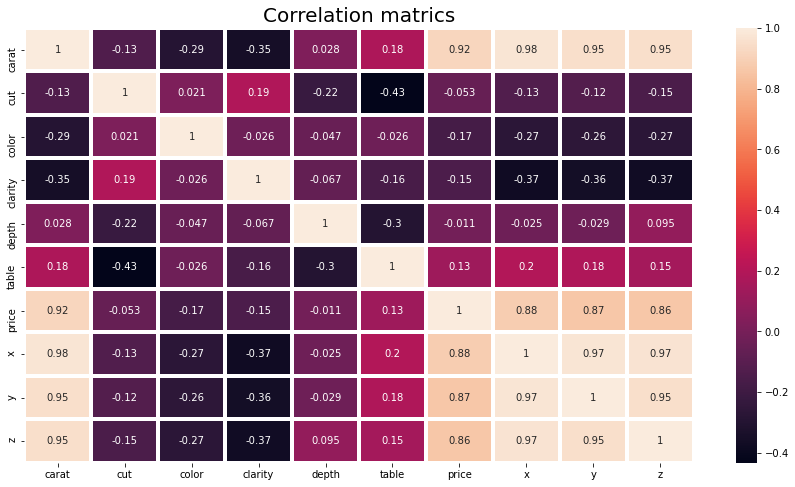

In [16]:
#Correlation with Price column
fig=plt.figure(figsize=(15,8))
sns.heatmap(df_mapped.corr(), linewidths=3, annot=True)
plt.title("Correlation matrics", size=20)

In [17]:
#split dataset in features and target variable
feature_cols = ['clarity', 'carat', 'cut', 'color','depth','table','x', 'y', 'z']
X = df_mapped[feature_cols] # Features
y = df_mapped.price.astype('float64') # Target variable

In [18]:
# split X and y into training and testing sets
valid_portion = 0.5

train_x, validation_x, train_y, validation_y = train_test_split(X, y, test_size=valid_portion, random_state=1)

## **Start with RandomForest to check efficiency**
We can see that with RandomForest the RMSE would look very good as well as the R2. But as we will see later on, to check its veracity we need to do a K-Fold.

In [19]:
# Addestramento di un RandomForestRegressor
rndfor_reg = RandomForestRegressor()
rndfor_reg.fit(train_x, train_y)

# Ottenimento delle predizioni
train_y_predicted = rndfor_reg.predict(train_x)

# Calcolo del RMSE
rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
printmd("**Regressor Information**")
print('Train RMSE: ', rmse) 

# Ottenimento delle predizioni (validation) e calcolo RMSE
validation_y_predicted = rndfor_reg.predict(validation_x)
rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
print('Validation RMSE: ', rmse)
print('R2 score:', rndfor_reg.score(validation_x, validation_y))
printmd("**Information about feature importance according to the Regressor**")
for i, j in zip(feature_cols, rndfor_reg.feature_importances_):
    print(i, j)

**Regressor Information**

Train RMSE:  210.82269795973664
Validation RMSE:  555.2446984208308
R2 score: 0.9802245255322912


**Information about feature importance according to the Regressor**

clarity 0.06283779909917907
carat 0.4569335821198947
cut 0.0017155499307173166
color 0.031422949172279904
depth 0.0029773483667109267
table 0.002279805899265216
x 0.005687965671299705
y 0.43019541831084096
z 0.0059495814298123825


## **Check if the LinearRegressor can do better**
Compared to the RandomForest Regressor we can see that the linear one only makes things worse. Both in terms of score and RMSE. This is to be expected. 

In [20]:
# Addestramento di un LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(train_x, train_y)

# Ottenimento delle predizioni
train_y_predicted = lin_reg.predict(train_x)

# Calcolo del RMSE
rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
print('Train RMSE: ', rmse) 

# Ottenimento delle predizioni (validation) e calcolo RMSE
validation_y_predicted = lin_reg.predict(validation_x)
rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
print('Validation RMSE: ', rmse)
print('R2 score:', lin_reg.score(validation_x, validation_y))

Train RMSE:  1229.2485789721898
Validation RMSE:  1204.5442615091756
R2 score: 0.9069313108306197


## **Doing a K-Fold Cross-Validation to check if it affects RMSE optimisation**
By doing K-Fold Cross-Validation we can see that in fact the values we previously obtained with the RandomForestRegressor were due to chance. The true RMSE is 1770.62.

In [21]:
# Ottimizzazione con Cross-Validation
reg = RandomForestRegressor() 

param_grid = [{'n_estimators': [10, 50, 100], 'max_depth': [None, 2, 3], 'random_state': [1234]}]

# Con shuffle=False si otterranno fold temporalmente ordinate
# (se i pattern non sono stati precedentemente mescolati)
experiment_gscv = GridSearchCV(reg, param_grid, \
                               cv=KFold(n_splits=4), \
                               scoring='neg_mean_squared_error')

experiment_gscv.fit(X, y)

# Print results
printmd('**Combinazioni di parametri:**')
print(experiment_gscv.cv_results_['params'])
printmd('**RMSE medio per combinazione:**')
print( np.sqrt(-experiment_gscv.cv_results_['mean_test_score']))
printmd('**Combinazione migliore:**')
print(experiment_gscv.best_params_)
printmd("**RMSE medio della combinazione migliore:**")
print('RMSE medio della combinazione migliore: %.3f' % np.sqrt(-experiment_gscv.best_score_))

**Combinazioni di parametri:**

[{'max_depth': None, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': None, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': None, 'n_estimators': 100, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 100, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 100, 'random_state': 1234}]


**RMSE medio per combinazione:**

[1858.5211656  1806.64242055 1770.62353266 2892.45112031 2868.41034669
 2875.19755245 2506.29438524 2488.8674007  2496.64787653]


**Combinazione migliore:**

{'max_depth': None, 'n_estimators': 100, 'random_state': 1234}


**RMSE medio della combinazione migliore:**

RMSE medio della combinazione migliore: 1770.624


## **What happens if we remove the outliers (z-score >3 or z-score <-3)?**
The basic idea would be to be able to remove the outliers from the validation set and see if they actually worsen the R2 (although the R2 obtained so far is very good). But first...
### It would be useful to count how many outliers are there per-columns 

In [22]:
Q1 = df_mapped.quantile(0.25)
Q3 = df_mapped.quantile(0.75)
IQR=Q3-Q1
df_clean=df_mapped[~((df_mapped<(Q1-1.5*IQR))|(df_mapped>(Q3+1.5*IQR))).any(axis=1)]

cols = df_mapped.columns
all_z_scores=pd.DataFrame()

for col in cols:
    col_zscore = col + '_zscore'
    all_z_scores[col_zscore] = (df_mapped[col] - df_mapped[col].mean())/df_mapped[col].std(ddof=0)

all_outliers={}
arr=[]

for col in all_z_scores.columns:
    all_outliers[col+"_outlier"]=np.sum(all_z_scores[col]>3)+np.sum(all_z_scores[col]<-3)
    
outliers=pd.DataFrame(all_outliers, index=[0])
outliers=outliers.sort_values(by=0, axis=1, ascending=True)
px.histogram(y=outliers.columns, x=outliers.loc[0], title="Number of outliers by every column in the dataframe",labels={ # replaces default labels by column name
                "sum of x": "Number of outliers",  "y": "Column"
            })

## **Could the R2 score improve if we do testing on the dataset without the outliers?**
### We expected it to be a lot better but...

In [23]:
feature_cols = ['clarity', 'carat', 'cut', 'color','depth','table','x', 'y', 'z']
X_outliers = df_clean[feature_cols] # Features
y_outliers = df_clean.price.astype('float64') # Target variable
# split X and y into training and testing sets
valid_portion = 0.5
# Split random to train, test set
train_x_outliers, validation_x_outliers, train_y_outliers, validation_y_outliers = train_test_split(X_outliers, y_outliers, test_size=valid_portion, random_state=1)
    
print('R2 score:', rndfor_reg.score(validation_x_outliers, validation_y_outliers)) # R2 score migliora minimamente

R2 score: 0.9875655765338912


# **Non-Linear Regression**
We realised that there were variables that had a correlation with the price that was not strictly linear.

## **Is there a non-linear correlation between price and other attributes?**
In fact, we can see from this scatter that the variables x, y, z and depth do not have a linear trend.


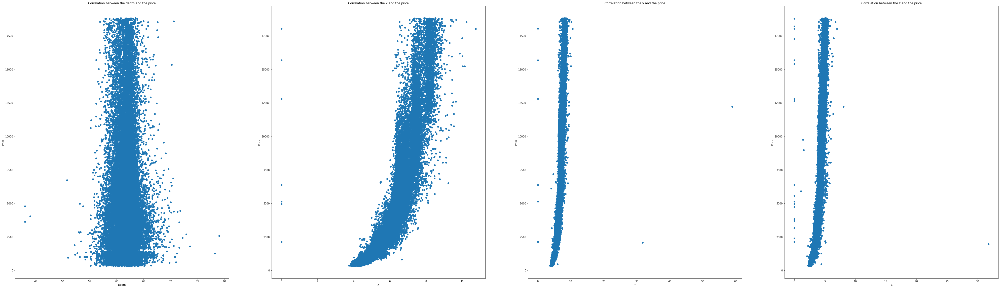

In [24]:
allGraphs=[]

fig, ax = plt.subplots(1, 4, figsize=(70, 20))
ax[0].scatter(x = df_mapped["depth"], y = df_mapped["price"])
ax[0].set_xlabel("Depth")
ax[0].set_ylabel("Price")
ax[0].set_title('Correlation between the depth and the price')

ax[1].scatter(x =df_mapped["x"], y=df_mapped["price"])
ax[1].set_xlabel("X")
ax[1].set_ylabel("Price")
ax[1].set_title('Correlation between the x and the price')
                    
ax[2].scatter(x = df_mapped["y"], y = df_mapped["price"])
ax[2].set_xlabel("Y")
ax[2].set_ylabel("Price")
ax[2].set_title('Correlation between the y and the price')

ax[3].scatter(y =df_mapped["price"], x=df_mapped["z"])
ax[3].set_xlabel("Z")
ax[3].set_ylabel("Price")
ax[3].set_title('Correlation between the z and the price')

plt.show()

In [25]:
cols=0
def linear_regression(data, power, models_to_plot, col, fig):
    #initialize predictors:
    global cols
    predictors=[col]
    if power>=2:
        predictors.extend([col+'_{}'.format(i) for i in range(2,power+1)])
    
    spaced_value_feature=np.linspace(np.min(data[col]), np.max(data[col]), 500)
    df_spaced=pd.DataFrame({col:spaced_value_feature})

    for i in range(2,16):  #power of 1 is already there
        colname = col+'_{}'.format(i)      #new var will be x_power
        df_spaced[colname] = df_spaced[col]**i
    
    data=data.sort_values(col)
    #Fit the model
    linreg = LinearRegression(normalize=True)
    linreg.fit(data[predictors],data['price'])
    y_pred = linreg.predict(data[predictors])    
    
    #Check if a plot is to be made for the entered power
    if power in models_to_plot:
        cols=cols+1
        sampled=data.sample(n=500, random_state=1234)
        spaced=linreg.predict(df_spaced[predictors])
        fig.add_trace(go.Scatter(x=sampled[col], y=sampled['price'], mode="markers", name="data"), row=1, col=cols)
        fig.add_trace(go.Scatter(x=df_spaced[col], y=spaced, mode="lines", name="estimate"), row=1, col=cols)
        fig.update_yaxes(range=[np.min(sampled['price']), np.max(sampled['price'])])
        fig.update_xaxes(range=[np.min(sampled[col]), np.max(sampled[col])])

    #Return the result in pre-defined format
    rss = sum((y_pred-data['price'])**2)
    ret = [rss]
    ret.extend([linreg.intercept_])
    ret.extend(linreg.coef_)
    return ret

In [26]:
df_copy=df_mapped.copy()

In [27]:
col_features = ['x', 'y', 'z']
for col_feature in col_features:
    for i in range(2,16):  #power of 1 is already there
        colname = col_feature+'_{}'.format(i)      #new var will be x_power
        df_copy[colname] = df_copy[col_feature]**i
        
    global cols
    cols=0
    #Initialize a dataframe to store the results:
    col = ['rss','intercept'] + ['coef'+col_feature+'_{}'.format(i) for i in range(1,16)]
    ind = ['model_pow_{}'.format(i) for i in range(1,16)]
    coef_matrix_simple = pd.DataFrame(index=ind, columns=col)

    #Define the powers for which a plot is required:
    models_to_plot = {2:231,6:233,15:236}
    
    fig = make_subplots(rows=1, cols=3, subplot_titles=("Power 2", "Power 6", "Power 15"))

    #Iterate through all powers and assimilate results
    for i in range(1,16):
        coef_matrix_simple.iloc[i-1,0:i+2] =linear_regression(df_copy, power=i, models_to_plot=models_to_plot,col=col_feature, fig=fig)
    fig.update_layout(height=600, width=800, title_text=f"Non Linear Regression for feature {col_feature}")
    
    for i in range(1, 4):
        fig['layout']['xaxis{}'.format(i)]['title']=col_feature
    
    fig['layout']['yaxis']['title']="price"
    fig.show()
    display(coef_matrix_simple)

,rss,intercept,coefx_1,coefx_2,coefx_3,coefx_4,coefx_5,coefx_6,coefx_7,coefx_8,coefx_9,coefx_10,coefx_11,coefx_12,coefx_13,coefx_14,coefx_15
model_pow_1,1.86954e+11,-14094.1,3145.41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_2,1.20902e+11,12791.9,-6248.31,790.246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_3,1.20307e+11,19581.8,-9824.89,1400.99,-33.842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_4,1.14774e+11,6093.92,4676.11,-3531.73,639.769,-32.1179,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_5,1.13448e+11,8084.5,-8979.33,4766.1,-1285.78,164.385,-7.4027,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_6,1.12663e+11,8493.84,-46806.2,34695.4,-10598.6,1585.36,-113.699,3.11932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_7,1.12099e+11,8402.28,74575,-80682.6,34297.6,-7566.85,917.228,-57.7299,1.47051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_8,1.12096e+11,8403.98,43451.9,-46212.3,18199.3,-3457.44,297.922,-2.62038,-1.21121,0.0550633,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_9,1.11906e+11,8407.51,-1.01843e+06,1.29655e+06,-713604,221057,-42115.5,5050.18,-371.991,15.3813,-0.27329,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_10,1.11767e+11,8406.76,2.5786e+06,-3.81887e+06,2.47638e+06,-923872,218547,-33992.2,3475.83,-225.276,8.39597,-0.137075,NaN,NaN,NaN,NaN,NaN


,rss,intercept,coefy_1,coefy_2,coefy_3,coefy_4,coefy_5,coefy_6,coefy_7,coefy_8,coefy_9,coefy_10,coefy_11,coefy_12,coefy_13,coefy_14,coefy_15
model_pow_1,2.15517e+11,-13402,3022.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_2,1.95775e+11,-15761.2,3730.24,-49.6423,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_3,1.7107e+11,-3046.15,-932.377,401.752,-6.56847,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_4,1.15337e+11,25612.7,-13051.9,1984.21,-73.8428,0.744498,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_5,1.14511e+11,16756.1,-7797.8,893.166,18.9312,-2.08403,0.0261961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_6,1.10369e+11,6781.94,7065.94,-5315.7,1098.33,-84.2331,2.40393,-0.0214768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_7,1.07996e+11,8778.99,-19777.5,13007.4,-3805.65,546.816,-36.7429,0.999211,-0.00875111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_8,1.07722e+11,8959.64,-54186.4,42342.8,-13911.6,2342.4,-210.478,9.81874,-0.213587,0.00165007,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_9,1.07158e+11,8892.97,140035,-154238,69156.4,-16633.9,2320.95,-188.268,8.39717,-0.179672,0.00138036,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_10,1.07082e+11,8899.21,-128693,160819,-88891.8,27647,-5257.07,624.201,-45.2726,1.87261,-0.0382606,0.00028629,NaN,NaN,NaN,NaN,NaN


,rss,intercept,coefz_1,coefz_2,coefz_3,coefz_4,coefz_5,coefz_6,coefz_7,coefz_8,coefz_9,coefz_10,coefz_11,coefz_12,coefz_13,coefz_14,coefz_15
model_pow_1,2.217e+11,-13296.6,4868.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_2,2.12469e+11,-15219.1,5859.02,-121.473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_3,1.3434e+11,14286.2,-11955.2,2742.02,-74.7947,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_4,1.34188e+11,16425,-13965.9,3372.18,-146.408,1.6894,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_5,1.25151e+11,8713.35,3935.36,-7838.93,2632.71,-266.181,6.00674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_6,1.24998e+11,8294.8,8749.49,-12442.9,4325.85,-549.771,26.2688,-0.40503,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_7,1.22158e+11,8961.33,-55923.3,67893.9,-35160.5,9110.38,-1184.15,69.6424,-1.26998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_8,1.22109e+11,8910.94,-34128,35097.2,-14913.5,2519.21,23.4767,-52.379,4.76907,-0.100942,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_9,1.20793e+11,8767.26,170238,-346397,283291,-124429,32021,-4894.38,426.907,-18.8054,0.293652,NaN,NaN,NaN,NaN,NaN,NaN
model_pow_10,1.20418e+11,8798.29,-35067.6,134119,-187723,130406,-51892.4,12498.2,-1826.27,154.597,-6.68234,0.103303,NaN,NaN,NaN,NaN,NaN


# **Ridge-Regression**
From the correlation table we can see that the rss is so big because of the big values of the prices. Doing an error on huge numbers will make the rss a great number too. 

In [28]:
def ridge_regression(data, predictors, alpha,col,fig, models_to_plot={}):
    global cols
    
    spaced_value_feature=np.linspace(np.min(data[col]), np.max(data[col]), 500)
    df_spaced=pd.DataFrame({col:spaced_value_feature})

    for i in range(2,6):  #power of 1 is already there
        colname = col+'_{}'.format(i)      #new var will be x_power
        df_spaced[colname] = df_spaced[col]**i
    
    ridgereg = Ridge(alpha=alpha,normalize=True)
    ridgereg.fit(data[predictors],data['price'])
    y_pred = ridgereg.predict(data[predictors])
    
    #Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:        
        cols=cols+1
        sampled=data.sample(n=500, random_state=1234)
        spaced=ridgereg.predict(df_spaced[predictors])
        fig.add_trace(go.Scatter(x=sampled[col], y=sampled['price'], mode="markers", name="data"), row=1, col=cols)
        fig.add_trace(go.Scatter(x=df_spaced[col], y=spaced, mode="lines", name="estimate"), row=1, col=cols)
        fig.update_yaxes(range=[np.min(sampled['price']), np.max(sampled['price'])])
        fig.update_xaxes(range=[np.min(sampled[col]), np.max(sampled[col])])
        
    #Return the result in pre-defined format
    rss = sum((y_pred-data['price'])**2)
    ret = [rss]
    ret.extend([ridgereg.intercept_])
    ret.extend(ridgereg.coef_)
    return ret

In [29]:
#Initialize predictors to be set of 15 powers of x
for col_feature in col_features:
    global cols
    cols=0
    predictors=[col_feature]
    predictors.extend([col_feature+'_{}'.format(i) for i in range(2,6)])

    #Set the different values of alpha to be tested
    alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 10, 20]

    #Initialize the dataframe for storing coefficients.
    col = ['rss','intercept'] + ['coef_'+col_feature+'_{}'.format(i) for i in range(1,6)]
    ind = ['alpha_{}'.format(alpha_ridge[i]) for i in range(0,10)]
    coef_matrix_ridge = pd.DataFrame(index=ind, columns=col)

    models_to_plot = {1e-15:231, 1e-10:232, 5:236}
    
    fig = make_subplots(rows=1, cols=3, subplot_titles=("Alpha 1e-15", "Alpha 1e-10", "Alpha 5"))
    for i in range(10):
        coef_matrix_ridge.iloc[i,] = ridge_regression(df_copy, predictors, alpha_ridge[i],col_feature,fig, models_to_plot)
        
    fig.update_layout(height=600, width=800, title_text=f"Ridge Regression for feature {col_feature}")
    for i in range(1, 4):
        fig['layout']['xaxis{}'.format(i)]['title']=col_feature
    
    fig['layout']['yaxis']['title']="price"
    fig.show()
    display(coef_matrix_ridge)

,rss,intercept,coef_x_1,coef_x_2,coef_x_3,coef_x_4,coef_x_5
alpha_1e-15,1.13448e+11,8084.5,-8979.33,4766.1,-1285.78,164.385,-7.4027
alpha_1e-10,1.13448e+11,8083.41,-8974.12,4763.05,-1285.08,164.314,-7.40008
alpha_1e-08,1.13449e+11,7980.16,-8482.79,4474.65,-1219.3,157.685,-7.153
alpha_0.0001,1.15574e+11,13961.8,-4459.71,-78.665,74.2241,8.45359,-0.99066
alpha_0.001,1.19381e+11,8141.18,-3307.96,162.593,38.1599,3.0158,-0.325176
alpha_0.01,1.26381e+11,-334.75,-450.018,64.0332,11.6815,1.26068,0.0579142
alpha_1,1.52743e+11,-2921.37,490.225,44.5227,5.04942,0.606781,0.0734062
alpha_5,3.17696e+11,-252.28,312.301,27.1417,2.98389,0.350912,0.0419131
alpha_10,4.59588e+11,1143.24,209.294,18.0887,1.98036,0.232185,0.0276782
alpha_20,6.00951e+11,2260.89,125.78,10.8407,1.18435,0.138641,0.0165103


,rss,intercept,coef_y_1,coef_y_2,coef_y_3,coef_y_4,coef_y_5
alpha_1e-15,1.14511e+11,16756.1,-7797.8,893.166,18.9312,-2.08403,0.0261961
alpha_1e-10,1.14511e+11,16757.4,-7798.6,893.333,18.917,-2.0836,0.0261921
alpha_1e-08,1.14512e+11,16889,-7876.49,909.468,17.5478,-2.04191,0.0258063
alpha_0.0001,1.18115e+11,15355,-8381.97,1281.3,-32.7043,-0.190943,0.00708802
alpha_0.001,1.52414e+11,-2096.91,-1470.72,495.261,-11.1961,-0.0725074,0.00216946
alpha_0.01,1.79954e+11,-10114.2,1712.28,134.651,-1.60008,-0.0209603,4.04066e-05
alpha_1,3.20684e+11,-4780.55,1276.24,41.5481,-0.0739631,-0.00494618,-9.12077e-05
alpha_5,6.07078e+11,689.76,465.963,16.5518,0.0310892,-0.000777597,-1.63654e-05
alpha_10,7.06952e+11,2094.17,262.017,9.65151,0.0305004,-0.000204816,-5.27959e-06
alpha_20,7.73639e+11,2943.71,140.126,5.29484,0.0212824,-2.06805e-05,-1.31901e-06


,rss,intercept,coef_z_1,coef_z_2,coef_z_3,coef_z_4,coef_z_5
alpha_1e-15,1.25151e+11,8713.35,3935.36,-7838.93,2632.71,-266.181,6.00674
alpha_1e-10,1.25151e+11,8724.62,3910.54,-7823.67,2628.96,-265.823,5.99872
alpha_1e-08,1.25276e+11,9707.45,1745.99,-6492.9,2302.4,-234.551,5.29896
alpha_0.0001,1.3485e+11,11528.7,-9652.38,2104.98,-12.3425,-0.977369,-0.0133735
alpha_0.001,1.37155e+11,6697.97,-6555.72,1534.34,13.1517,-0.749821,-0.0308426
alpha_0.01,1.61201e+11,-4507.31,-241.312,700.485,5.41481,-0.358917,-0.015254
alpha_1,3.07557e+11,-4721.09,1913.9,145.057,0.16192,-0.0589968,-0.00220667
alpha_5,5.88795e+11,570.533,732.191,57.8353,0.41369,-0.00924792,-0.000412318
alpha_10,6.93673e+11,2005.89,416.249,33.6933,0.317321,-0.00237298,-0.000142372
alpha_20,7.65426e+11,2889.53,224.051,18.4606,0.20225,-0.00018407,-4.18318e-05


## **Lasso**
### Do Lasso to check the columns that infers more

In [30]:
def lasso_regression(data, predictors, alpha,col,fig, models_to_plot={}):
    global cols
    
    spaced_value_feature=np.linspace(np.min(data[col]), np.max(data[col]), 500)
    df_spaced=pd.DataFrame({col:spaced_value_feature})

    for i in range(2,16):  #power of 1 is already there
        colname = col+'_{}'.format(i)      #new var will be x_power
        df_spaced[colname] = df_spaced[col]**i
        
    lassoreg = Lasso(alpha=alpha,normalize=True, max_iter=1e2)
    lassoreg.fit(data[predictors],data['price'])
    y_pred = lassoreg.predict(data[predictors])
    
    #Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:
        cols=cols+1
        sampled=data.sample(n=500, random_state=1234)
        spaced=lassoreg.predict(df_spaced[predictors])
        fig.add_trace(go.Scatter(x=sampled[col], y=sampled['price'], mode="markers", name="data"), row=1, col=cols)
        fig.add_trace(go.Scatter(x=df_spaced[col], y=spaced, mode="lines", name="estimate"), row=1, col=cols)
        fig.update_yaxes(range=[np.min(sampled['price']), np.max(sampled['price'])])
        fig.update_xaxes(range=[np.min(sampled[col]), np.max(sampled[col])])

    #Return the result in pre-defined format
    rss = sum((y_pred-data['price'])**2)
    ret = [rss]
    ret.extend([lassoreg.intercept_])
    ret.extend(lassoreg.coef_)
    return ret

In [31]:
#Initialize predictors to be set of 15 powers of x
for col_feature in col_features:
    global cols
    cols=0
    predictors=[col_feature]
    predictors.extend([col_feature+'_{}'.format(i) for i in range(2,16)])

    #Set the different values of alpha to be tested
    alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 10, 20]

    #Initialize the dataframe for storing coefficients.
    col = ['rss','intercept'] + ['coef_'+col_feature+'_{}'.format(i) for i in range(1,16)]
    ind = ['alpha_{}'.format(alpha_ridge[i]) for i in range(0,10)]
    coef_matrix_ridge = pd.DataFrame(index=ind, columns=col)

    models_to_plot = {1e-15:231, 1e-10:232, 5:236}
    
    fig = make_subplots(rows=1, cols=3, subplot_titles=("Alpha 1e-15", "Alpha 1e-10", "Alpha 5"))
    for i in range(10):
        coef_matrix_ridge.iloc[i,] = lasso_regression(df_copy, predictors, alpha_ridge[i],col_feature,fig, models_to_plot)
        
    fig.update_layout(height=600, width=800, title_text=f"Ridge Regression for feature {col_feature}")
    for i in range(1, 4):
        fig['layout']['xaxis{}'.format(i)]['title']=col_feature
    
    fig['layout']['yaxis']['title']="price"
    fig.show()
    display(coef_matrix_ridge)

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 57651714885.70906, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 57651714755.14087, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 57651701828.757706, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iteration

,rss,intercept,coef_x_1,coef_x_2,coef_x_3,coef_x_4,coef_x_5,coef_x_6,coef_x_7,coef_x_8,coef_x_9,coef_x_10,coef_x_11,coef_x_12,coef_x_13,coef_x_14,coef_x_15
alpha_1e-15,1.15303e+11,5096.65,-2172.9,161.976,13.9473,1.27827,0.109651,0.00802995,0.000399933,-7.22845e-06,-5.41232e-06,-9.1209e-07,-1.08538e-07,-9.85351e-09,-5.9282e-10,3.53844e-12,7.78876e-12
alpha_1e-10,1.15303e+11,5096.65,-2172.9,161.976,13.9473,1.27827,0.109651,0.00802995,0.000399933,-7.22845e-06,-5.41232e-06,-9.1209e-07,-1.08538e-07,-9.85351e-09,-5.9282e-10,3.53844e-12,7.78876e-12
alpha_1e-08,1.15303e+11,5096.65,-2172.9,161.976,13.9473,1.27827,0.109651,0.00802994,0.000399933,-7.22845e-06,-5.41232e-06,-9.1209e-07,-1.08538e-07,-9.85351e-09,-5.9282e-10,3.53845e-12,7.78875e-12
alpha_0.0001,1.15309e+11,5086.41,-2169.21,161.689,13.945,1.27786,0.10959,0.00802178,0.000398943,-7.19091e-06,-5.36877e-06,-9.0993e-07,-1.08467e-07,-9.84847e-09,-5.91887e-10,3.59354e-12,7.72374e-12
alpha_0.001,1.15364e+11,4994.29,-2135.98,159.105,13.9248,1.27416,0.109037,0.00794826,0.000390038,-6.66863e-06,-4.99836e-06,-8.90449e-07,-1.07825e-07,-9.80269e-09,-5.83438e-10,3.90161e-12,7.15889e-12
alpha_0.01,1.15927e+11,4098.21,-1810.4,133.378,13.7385,1.23923,0.103767,0.00724083,0.000303609,-0,-1.44875e-06,-6.93935e-07,-1.0227e-07,-9.46971e-09,-5.09555e-10,0,2.42032e-12
alpha_1,1.29792e+11,-1178.53,0,0,15.516,1.19202,0.0278028,0,0,0,0,0,0,0,-0,-0,-0
alpha_5,1.99234e+11,227.502,0,0,9.8794,1.21121,0,0,0,0,0,0,0,0,0,0,0
alpha_10,4.17803e+11,2004.29,0,0,4.05398,0.800881,0,0,0,0,0,0,0,0,0,0,0
alpha_20,8.58473e+11,3932.8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 87663854888.01605, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 87663854679.23033, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 87663834009.23819, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations

,rss,intercept,coef_y_1,coef_y_2,coef_y_3,coef_y_4,coef_y_5,coef_y_6,coef_y_7,coef_y_8,coef_y_9,coef_y_10,coef_y_11,coef_y_12,coef_y_13,coef_y_14,coef_y_15
alpha_1e-15,1.75328e+11,-10542.6,1724.07,161.666,-4.33049,-0.0113652,0.000169614,2.64738e-06,2.77256e-08,2.63931e-10,2.44527e-12,2.24805e-14,2.06229e-16,1.89077e-18,1.73324e-20,1.58878e-22,1.45633e-24
alpha_1e-10,1.75328e+11,-10542.6,1724.07,161.666,-4.33049,-0.0113652,0.000169614,2.64738e-06,2.77256e-08,2.63931e-10,2.44527e-12,2.24805e-14,2.06229e-16,1.89077e-18,1.73324e-20,1.58878e-22,1.45633e-24
alpha_1e-08,1.75328e+11,-10542.6,1724.07,161.666,-4.33049,-0.0113652,0.000169614,2.64738e-06,2.77256e-08,2.63931e-10,2.44527e-12,2.24805e-14,2.06229e-16,1.89077e-18,1.73324e-20,1.58878e-22,1.45633e-24
alpha_0.0001,1.75332e+11,-10542.7,1724.32,161.603,-4.32637,-0.0113525,0.000168298,2.64858e-06,2.77414e-08,2.64077e-10,2.44661e-12,2.24927e-14,2.06341e-16,1.8918e-18,1.73418e-20,1.58964e-22,1.45712e-24
alpha_0.001,1.75375e+11,-10544,1726.5,161.042,-4.28924,-0.0112382,0.000156451,2.6593e-06,2.7884e-08,2.65386e-10,2.45861e-12,2.26027e-14,2.07349e-16,1.90104e-18,1.74265e-20,1.5974e-22,1.46424e-24
alpha_0.01,1.75842e+11,-10560.7,1749.95,155.262,-3.91429,-0.01011,3.90483e-05,2.76229e-06,2.90418e-08,2.78452e-10,2.57837e-12,2.37002e-14,2.17407e-16,1.99322e-18,1.82715e-20,1.67485e-22,1.53523e-24
alpha_1,1.97256e+11,-12690,2900.89,0,-0,-0.007874,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0
alpha_5,2.88255e+11,-7571.47,2006.14,0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0
alpha_10,5.06469e+11,-1740.92,989.397,0,0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0
alpha_20,8.58473e+11,3932.8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 76643982098.60341, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 76643982015.29265, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 76643974154.57953, tolerance: 85847313.55173963

C:\Users\MohamedBoutaleb\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations

,rss,intercept,coef_z_1,coef_z_2,coef_z_3,coef_z_4,coef_z_5,coef_z_6,coef_z_7,coef_z_8,coef_z_9,coef_z_10,coef_z_11,coef_z_12,coef_z_13,coef_z_14,coef_z_15
alpha_1e-15,1.53288e+11,-1412.57,-2320.04,1101.79,-13.8148,-0.430283,-0.00373756,-2.4733e-05,-1.43189e-07,-7.57718e-10,-3.70042e-12,-1.63473e-14,-6.00294e-17,-1.15664e-19,9.03125e-22,1.61803e-23,1.72261e-25
alpha_1e-10,1.53288e+11,-1412.57,-2320.04,1101.79,-13.8148,-0.430283,-0.00373756,-2.4733e-05,-1.43189e-07,-7.57718e-10,-3.70042e-12,-1.63473e-14,-6.00294e-17,-1.15664e-19,8.9329e-22,1.57513e-23,1.65323e-25
alpha_1e-08,1.53288e+11,-1412.57,-2320.04,1101.79,-13.8148,-0.430283,-0.00373756,-2.4733e-05,-1.43189e-07,-7.57718e-10,-3.70042e-12,-1.63473e-14,-6.00294e-17,-1.15664e-19,2.90922e-23,6.33956e-24,7.81745e-26
alpha_0.0001,1.53297e+11,-1416.2,-2317.76,1101.39,-13.7985,-0.430431,-0.00373836,-2.47373e-05,-1.43212e-07,-7.57837e-10,-3.70105e-12,-1.63506e-14,-6.00477e-17,-1.15766e-19,-0,-0,-0
alpha_0.001,1.53376e+11,-1448.93,-2297.23,1097.78,-13.6517,-0.431759,-0.00374553,-2.47759e-05,-1.43416e-07,-7.58913e-10,-3.70672e-12,-1.63809e-14,-6.02123e-17,-1.16688e-19,-0,-0,-0
alpha_0.01,1.5416e+11,-1771.17,-2094.86,1062.15,-12.195,-0.445084,-0.00381729,-2.51613e-05,-1.45454e-07,-7.69608e-10,-3.76301e-12,-1.66806e-14,-6.18409e-17,-1.25793e-19,-0,-0,-0
alpha_1,2.0867e+11,-12424.3,4622.77,0,-0,-0,-0,-6.19722e-05,-3.70571e-07,-1.92677e-09,-9.74758e-12,-4.80857e-14,-2.30452e-16,-1.05968e-18,-4.53349e-21,-1.65702e-23,-3.4708e-26
alpha_5,2.94438e+11,-7473.42,3223.25,0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0
alpha_10,5.12653e+11,-1650.27,1577.7,0,0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0
alpha_20,8.58473e+11,3932.8,0,0,0,0,0,-0,-0,-0,-0,-0,-0,-0,-0,-0,-0


In [32]:
def lasso_regression(data, predictors, alpha, models_to_plot={}):
    #Fit the model
    lassoreg = Lasso(alpha=alpha,normalize=True, max_iter=1e5)
    lassoreg.fit(data[predictors],data['price'])
    y_pred = lassoreg.predict(data[predictors])
    
    #Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:
        plt.subplot(models_to_plot[alpha])
        plt.tight_layout()
        plt.plot(data[predictors],y_pred)
        plt.plot(data[predictors],data['price'],'.')
        plt.title('Plot for alpha: {}'.format(alpha))
    
    #Return the result in pre-defined format
    rss = sum((y_pred-data['price'])**2)
    ret = [rss]
    ret.extend([lassoreg.intercept_])
    ret.extend(lassoreg.coef_)
    return ret

As mentioned above, the variable with the most importance seems to be carat. In fact, from the table we can see that the feature that is never sent to 0 is x, even though the correlation between price and carat is more significant than the correlation between price and feature x. (0.92 control 0.88 respectively).

In [33]:
#Initialize predictors to all 15 powers of x
predictors=["cut", "table", "depth", "color", "clarity", "x", "y", "z"]

#Define the alpha values to test
alpha_lasso = [1e-15, 1e-10, 1e-8, 1e-5,1e-4, 1e-3,1e-2, 1, 5, 10]

#Initialize the dataframe to store coefficients
col = ['rss','intercept'] + ['coef_{}'.format(i) for i in predictors]
ind = ['alpha_{}'.format(alpha_lasso[i]) for i in range(0,10)]
coef_matrix_lasso = pd.DataFrame(index=ind, columns=col)

#Define the models to plot
models_to_plot = {}

#Iterate over the 10 alpha values:
for i in range(10):
    coef_matrix_lasso.iloc[i,] = lasso_regression(df_mapped, predictors, alpha_lasso[i], models_to_plot)
display(coef_matrix_lasso)

,rss,intercept,coef_cut,coef_table,coef_depth,coef_color,coef_clarity,coef_x,coef_y,coef_z
alpha_1e-15,1.4342e+11,-28551.5,130.644,-1.90243,117.747,247.12,543.245,3373.59,180.224,19.4235
alpha_1e-10,1.4342e+11,-28551.5,130.644,-1.90243,117.747,247.12,543.245,3373.59,180.224,19.4235
alpha_1e-08,1.4342e+11,-28551.5,130.644,-1.90243,117.747,247.12,543.245,3373.59,180.224,19.4235
alpha_1e-05,1.4342e+11,-28551.7,130.642,-1.902,117.75,247.119,543.243,3373.58,180.275,19.3568
alpha_0.0001,1.4342e+11,-28554.5,130.621,-1.90215,117.8,247.106,543.232,3374.04,180.493,18.2406
alpha_0.001,1.4342e+11,-28572.4,130.382,-1.92465,118.155,246.971,543.123,3380.53,179.69,8.8834
alpha_0.01,1.43422e+11,-28369.9,128.227,-1.73562,115.61,244.858,540.881,3373.49,177.978,16.0154
alpha_1,1.61603e+11,-15725.1,0,-0,0,20.0376,290.918,2930.51,86.059,147.103
alpha_5,2.59692e+11,-8161.09,0,0,0,-0,0,2110.2,0,0
alpha_10,4.77906e+11,-2228.13,-0,0,-0,-0,-0,1074.99,0,0


# **Classification**
In this section we will have an overview regarding the classification of our dataset.
There will be focused all the cathegorical variables ('color', 'cut' and 'clarity').<br>
We can start with a multiple plot created with Seaborn.
In this case we can see the variety of possible classification that Seaborn can realize.

<Figure size 800x640 with 0 Axes>

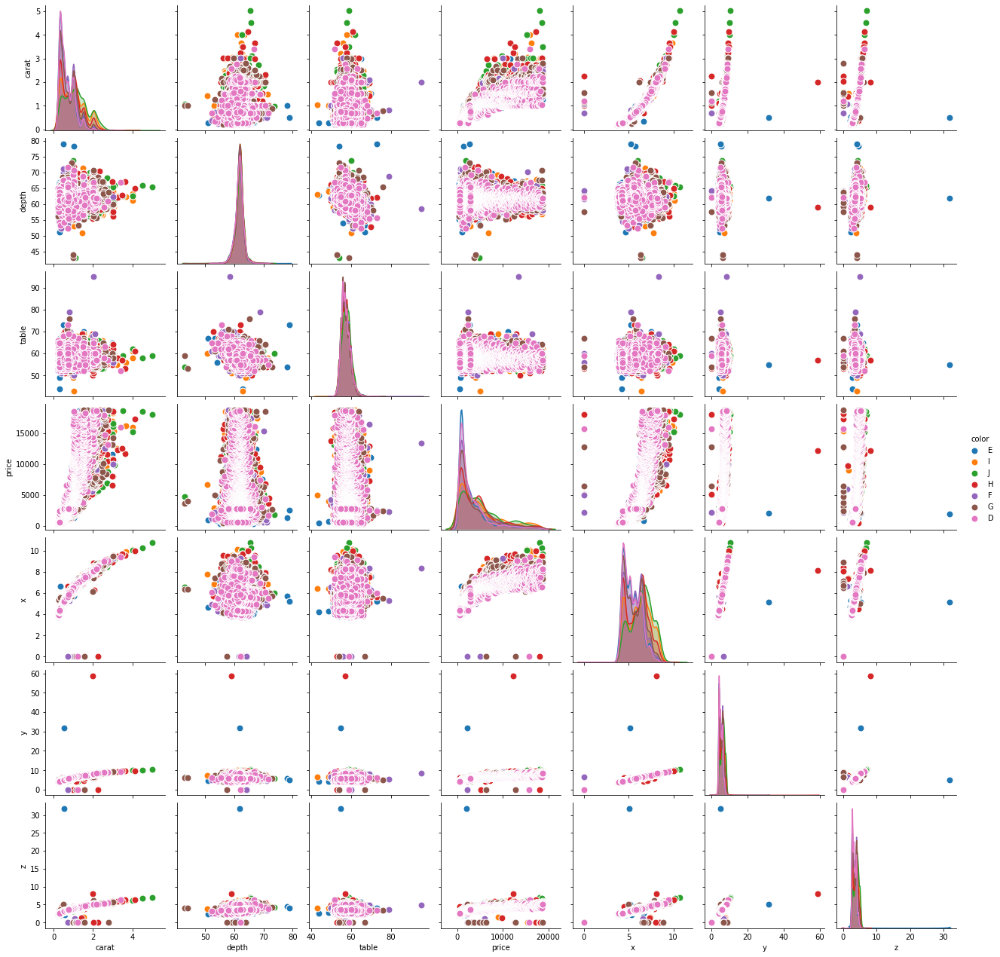

In [34]:
plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(df, kind="scatter", hue="color", plot_kws=dict(s=80, edgecolor="white", linewidth=1.0))
plt.show()

## **K-Nearest Neighbors**
In our project we compute neighbours basing on euclidean distance.

In [35]:
def euclidean_distance(row1, row2):
    distance = 0.0
    for i in range(len(row1)-1):
        distance += (row1[i] - row2[i])**2
    return sqrt(distance)

In [36]:
# Locate the most similar neighbors
def get_neighbors(train, test_row, num_neighbors):
    distances = list()
    for train_row in train:
        dist = euclidean_distance(test_row, train_row)
        distances.append((train_row, dist))
    distances.sort(key=lambda tup: tup[1])
    neighbors = list()
    for i in range(num_neighbors):
        neighbors.append(distances[i][0])
    return neighbors


# neighbors = get_neighbors(dataset, dataset[0], 3)
# for neighbor in neighbors:
#     print(neighbor)

In [37]:
# Make a classification prediction with neighbors
def predict_classification(train, test_row, num_neighbors):
    neighbors = get_neighbors(train, test_row, num_neighbors)
    output_values = [row[-1] for row in neighbors]
    prediction = max(set(output_values), key=output_values.count)
    return prediction

# prediction = predict_classification(df, dataset[0], 3)
# print('Expected %d, Got %d.' % (df[0][-1], prediction))

In [38]:
def set_df_last_column(df, column_name):
    df_col=df.drop(column_name, axis=1)
    df_col[column_name]=df[column_name]
    return df_col

**Printing the confusione matrix for cut**

[[ 245   66    8    8    4]
 [  40  548  279  109   28]
 [   1  294  832  738  586]
 [   1   70  575 1843  275]
 [   2   22  339  263 3612]]


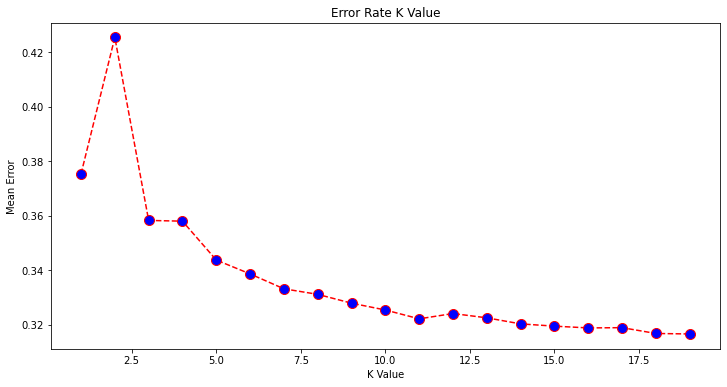

**Printing the confusione matrix for color**

[[192 156  87  45  33  31  10]
 [121 339 258 168 102  63  40]
 [ 83 265 529 340 174 141  88]
 [ 86 192 409 921 335 259 120]
 [ 39 111 251 503 506 335 121]
 [ 32 103 208 371 463 554 172]
 [ 28  52 157 263 279 357 296]]


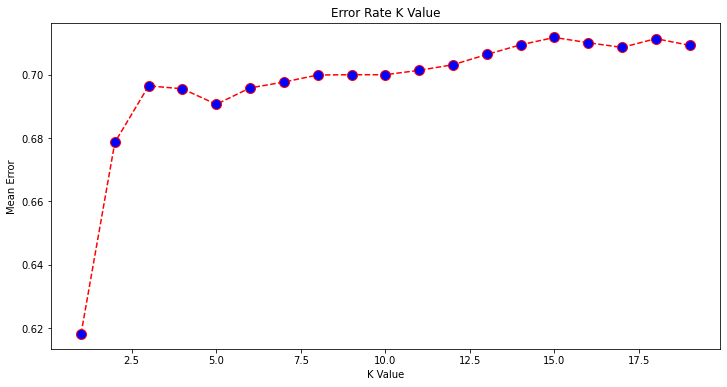

**Printing the confusione matrix for clarity**

[[  37   82   16    4    4    0    0    0]
 [  22 1004  556  160   58   17   18    2]
 [   8  583 1253  506  178   43   36    8]
 [   9  228  749 1056  281  100   58   16]
 [   4  102  395  507  440  112   61   16]
 [   3   29  130  230  219  240   78   27]
 [   1   24  101  138  139  138  155   41]
 [   1    9   41   53   56   64   62   80]]


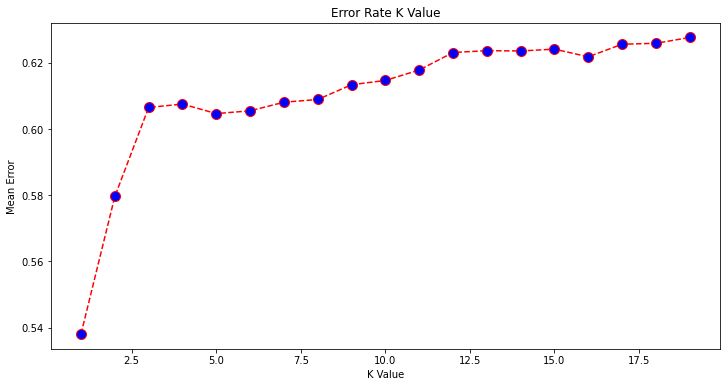

In [39]:
feature_clas_cols=["cut", "color", "clarity"]

for i in feature_clas_cols:
    df_color=set_df_last_column(df_mapped, i)

    X = df_color.iloc[:, :-1].values
    y = df_color.iloc[:, len(df_mapped.columns)-1].values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

    scaler = StandardScaler()
    scaler.fit(X_train)

    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)

    classifier = KNeighborsClassifier(n_neighbors=5)
    classifier.fit(X_train, y_train)

    y_pred = classifier.predict(X_test)

    printmd(f"**Printing the confusione matrix for {i}**")
    
    print(confusion_matrix(y_test, y_pred))
    classification_report(y_test, y_pred)


    error = []

    # Calculating error for K values between 1 and 40
    for i in range(1, 20):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(X_train, y_train)
        pred_i = knn.predict(X_test)
        error.append(np.mean(pred_i != y_test))

    plt.figure(figsize=(12, 6))
    plt.plot(range(1, 20), error, color='red', linestyle='dashed', marker='o',
             markerfacecolor='blue', markersize=10)
    plt.title('Error Rate K Value')
    plt.xlabel('K Value')
    plt.ylabel('Mean Error')

    plt.show()

    # plt.savefig("knn_color.png", dpi=300, bbox_inches='tight')

## **SVM**
We implemented a simple method that taking a dataframe and a feature name as input will return a new dataframe with the target value (specified as parameter) in the last column.
This is made to use subsequently the method getDatasetPatternsAndLabels().<br>
As made before, we split test and validation;
Subsequently, we consider a sample of 1000 elements and using as feature columns 'table' and 'x' and as target 'color'.
In this way we are going to train 3 different classifiers (KNN, linear SVM and radial-basis-function SVM) to compare the final results. 
We used a k-value of 5 for KNN and for each classifier we split in train and test with a 0.4 ratio.

In [40]:
def getDatasetPatternsAndLabels(df, featureCount):
    patterns=[]
    labels=df.iloc[:, -1:].values.reshape(1,-1)[0]
    
    for i, row in df.iterrows():
        currentRow=[]
        for columnName in range(featureCount):
            currentRow.append(row[df.columns[columnName]])
        patterns.append(currentRow)
    
    return pd.DataFrame(patterns), pd.DataFrame(labels)[0]

In [41]:
feature_count = 5

dfCut = set_df_last_column(df_mapped, "clarity")
dataset_patterns, dataset_labels = getDatasetPatternsAndLabels(dfCut, feature_count)

In [42]:
train_x, validation_x, train_y, validation_y = train_test_split(dataset_patterns, dataset_labels, test_size=0.25)
print('Shape training set:', train_x.shape)
print('Shape validation set:', validation_x.shape)

Shape training set: (40455, 5)
Shape validation set: (13485, 5)


In [44]:
# separate array into input and output components

df_sampled=df_mapped.head(n=1000)
#split dataset in features and target variable
feature_cols = ['table', 'x']
X = df_sampled[feature_cols] # Features
y = df_sampled.color.astype('float64') # Target variable

scaler = StandardScaler().fit(X)
X = scaler.transform(X)
# summarize transformed data
np.set_printoptions(precision=3)

train_x, validation_x, train_y, validation_y = train_test_split(X, y, test_size=0.40)
print('Shape dataset:', train_x.shape)
print('Shape labels:', validation_x.shape)
# train_x=train_x.values
# validation_x=validation_x.values
train_y=train_y.values
validation_y=validation_y.values
# validation_x
# train_y
train_x



Shape dataset: (600, 2)
Shape labels: (400, 2)


array([[ 0.918,  0.215],
       [-1.514,  0.375],
       [ 1.729,  0.167],
       ...,
       [-0.703,  0.359],
       [-0.703,  1.063],
       [ 2.54 ,  0.087]])

In [45]:
# Creazione del classificatore: soluzione
# Di seguito è riportata la procedura corretta per creare i suddetti classificatori.

clf_1 = KNeighborsClassifier(n_neighbors=5)
clf_2 = SVC(kernel="linear", C=1)
clf_3 = SVC(kernel="rbf", C=1, gamma=0.1)

printmd("**KNN**")
# Addestramento del classificatore: soluzione
clf_1.fit(train_x, train_y)
# Calcolo accuratezza
print("Accuratezza sul training set con KNN: {}".format(clf_1.score(train_x, train_y)))
print("Accuratezza sul validation set con  KNN: {}".format(clf_1.score(validation_x, validation_y)))

printmd("**SVM linear**")
# Addestramento del classificatore: soluzione
clf_2.fit(train_x, train_y)
# Calcolo accuratezza
print("Accuratezza sul training set con SVM con kernel lineare: {}".format(clf_2.score(train_x, train_y)))
print("Accuratezza sul validation set con SVM con kernel lineare: {}".format(clf_2.score(validation_x, validation_y)))

printmd("**SVM rbf**")
# Addestramento del classificatore: soluzione
clf_3.fit(train_x, train_y)
# Calcolo accuratezza
print("Accuratezza sul training set con SVM con kernel rbf: {}".format(clf_3.score(train_x, train_y)))
print("Accuratezza sul validation set con SVM con kernel rbf: {}".format(clf_3.score(validation_x, validation_y)))

#Visualizzazione 2D
# For some reason this plot is not working
# ml_visualization.show_2D_results(clf, (train_x, train_y, 'Training'), (validation_x, validation_y, 'Validation'))

**KNN**

Accuratezza sul training set con KNN: 0.48333333333333334
Accuratezza sul validation set con  KNN: 0.25


**SVM lineare**

Accuratezza sul training set con SVM con kernel lineare: 0.2633333333333333
Accuratezza sul validation set con SVM con kernel lineare: 0.2175


**SVM rbf**

Accuratezza sul training set con SVM con kernel rbf: 0.2733333333333333
Accuratezza sul validation set con SVM con kernel rbf: 0.2325


In [58]:
# ml_visualization.show_2D_results(clf_2, (train_x, train_y, 'Training'), (validation_x, validation_y, 'Validation'))

# **Bonus: how much should we spend on a diamond according to its characteristics?**
Now, we would like to sum up with a triplet of plot representing the mean price trend in relation to clarity, cut and color.
In this we a person could approssimate if it is worth to buy a considered diamond with certain features.

In [52]:
def display_price(df, age = (1,7), price = (100,100000), vehicle_type = "all", state = "all"):
    # Display the median price of vehicles depending on its type and its state.

    df = df[(df[vehicle_type] <= age[1]) & (df[vehicle_type] >= age[0])]

    df = df[(df["price"] >= price[0]) & (df["price"] <= price[1])]

    price_age = pd.pivot_table(df, values = "price", index = vehicle_type, aggfunc= np.average)
    price_age.columns = ["Average Price"]

    fig = plt.figure(figsize=(12,6))
    ax = fig.add_axes([0,0,1,1])
    ax2 = fig.add_axes([0.6,0.47,.35,.35])

    ax.plot(price_age["Average Price"], lw = 5)

    ax2.set_title(f"Column type: {vehicle_type}\nNumber of diamonds: {df.shape[0]}", fontsize = 15)
    ax2.axis('off')

    ax.set_title(f"Average price by {vehicle_type} of the diamonds",fontsize=25)
    ax.set_ylim(0,price_age["Average Price"].max()+1000)
    ax.set_xlabel(vehicle_type, fontsize = 15)
    ax.set_ylabel("Average price in $", fontsize = 15)

    ax.tick_params(axis='both', which='major', labelsize=15) 

#     plt.savefig(f"medians{vehicle_type}.png",dpi=300, bbox_inches='tight')

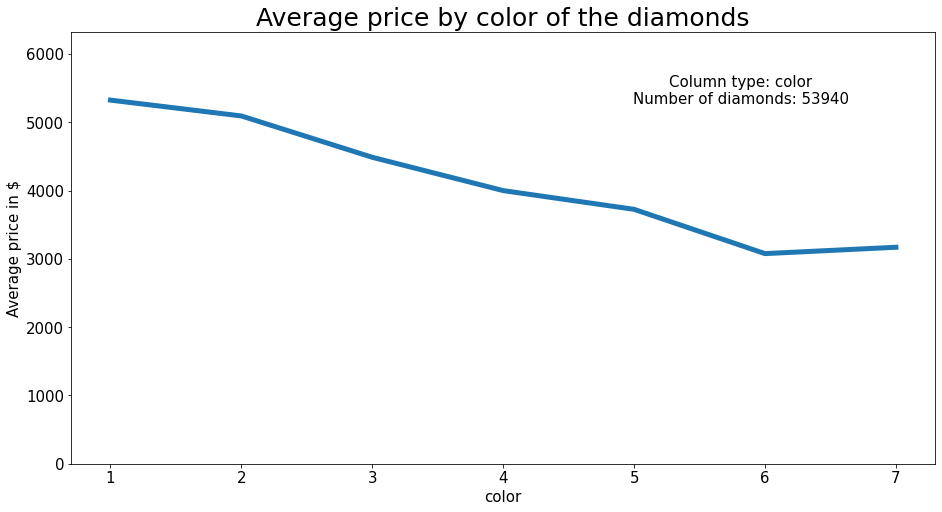

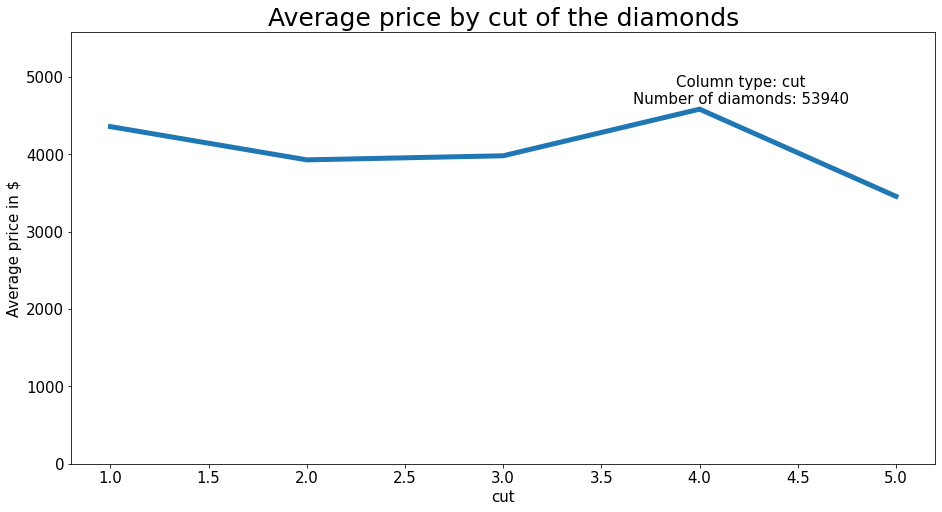

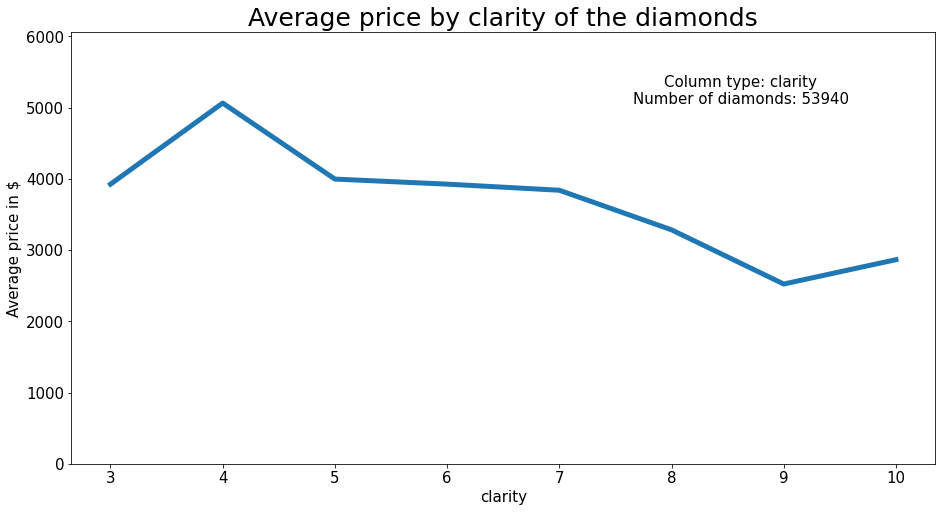

In [53]:
display_price(df_mapped, vehicle_type="color")
display_price(df_mapped,age=(1, 5), vehicle_type="cut")
display_price(df_mapped,age=(3, 10), vehicle_type="clarity")